# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [1]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from scipy import signal


# Obrazki
if not os.path.exists("jet.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/jet.png --no-check-certificate
if not os.path.exists("kw.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/kw.png --no-check-certificate
if not os.path.exists("moon.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/moon.png --no-check-certificate
if not os.path.exists("lenaSzum.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/lenaSzum.png --no-check-certificate
if not os.path.exists("lena.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/lena.png --no-check-certificate
if not os.path.exists("plansza.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/plansza.png --no-check-certificate




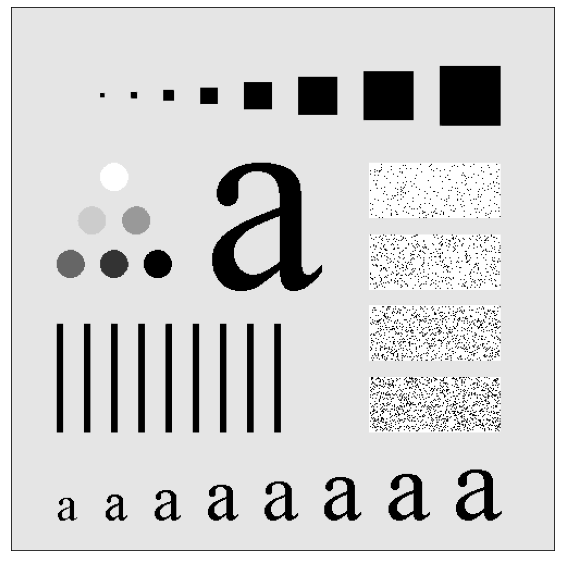

Text(0.5, 1.0, 'moduł różnicy')

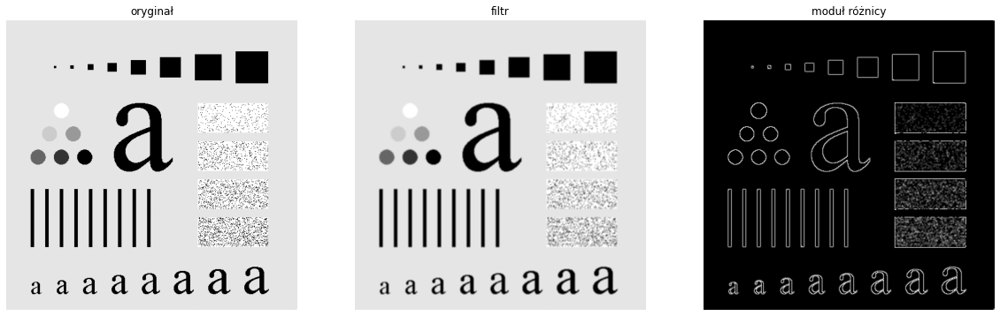

In [2]:
I = cv2.imread('plansza.png') 
I = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(10,10))
plt.imshow(I, cmap ="gray")
plt.xticks([]), plt.yticks([])  # Hides the graph ticks and x / y axis
plt.show()

res = cv2.filter2D(I, -1, np.ones((3,3))/9)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[1].set_title("filtr")
axs[2].imshow(np.abs(I-res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')
axs[2].set_title("moduł różnicy")


5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik. 

Text(0.5, 1.0, 'okno 35')

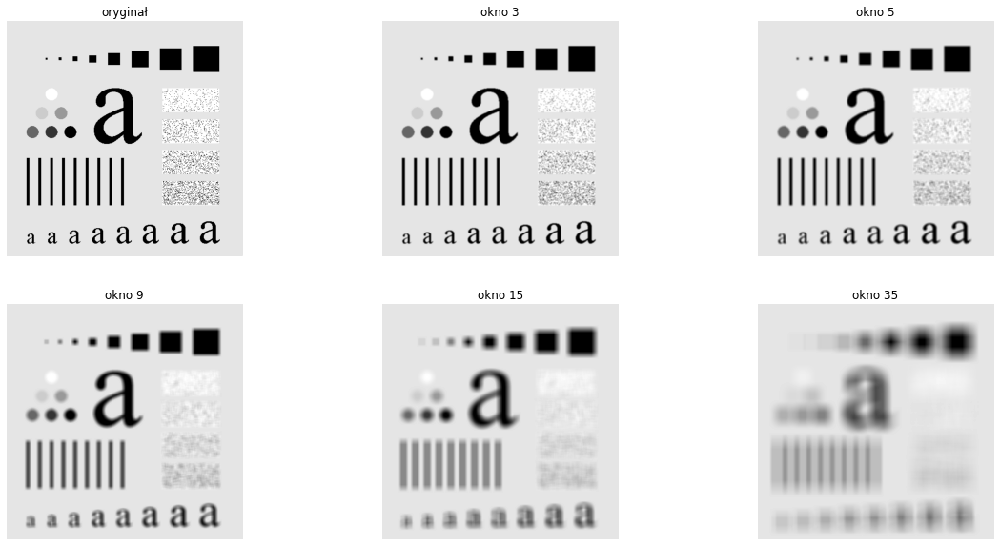

In [3]:
fig, axs = plt.subplots(2, 3)
fig.set_size_inches(20, 10)

axs[0, 0].imshow(I, 'gray', vmin=0, vmax=256)
axs[0, 0].axis('off')
axs[0, 0].set_title("oryginał")
axs[0, 1].imshow(cv2.filter2D(I, -1, np.ones((3,3))/9), 'gray', vmin=0, vmax=256)
axs[0, 1].axis('off')
axs[0, 1].set_title("okno 3")
axs[0, 2].imshow(cv2.filter2D(I, -1, np.ones((5,5))/25), 'gray', vmin=0, vmax=256)
axs[0, 2].axis('off')
axs[0, 2].set_title("okno 5")
axs[1, 0].imshow(cv2.filter2D(I, -1, np.ones((9,9))/81), 'gray', vmin=0, vmax=256)
axs[1, 0].axis('off')
axs[1, 0].set_title("okno 9")
axs[1, 1].imshow(cv2.filter2D(I, -1, np.ones((15,15))/(15*15)), 'gray', vmin=0, vmax=256)
axs[1, 1].axis('off')
axs[1, 1].set_title("okno 15")
axs[1, 2].imshow(cv2.filter2D(I, -1, np.ones((35,35))/(35*35)), 'gray', vmin=0, vmax=256)
axs[1, 2].axis('off')
axs[1, 2].set_title("okno 35")

6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

Text(0.5, 1.0, 'okno 35')

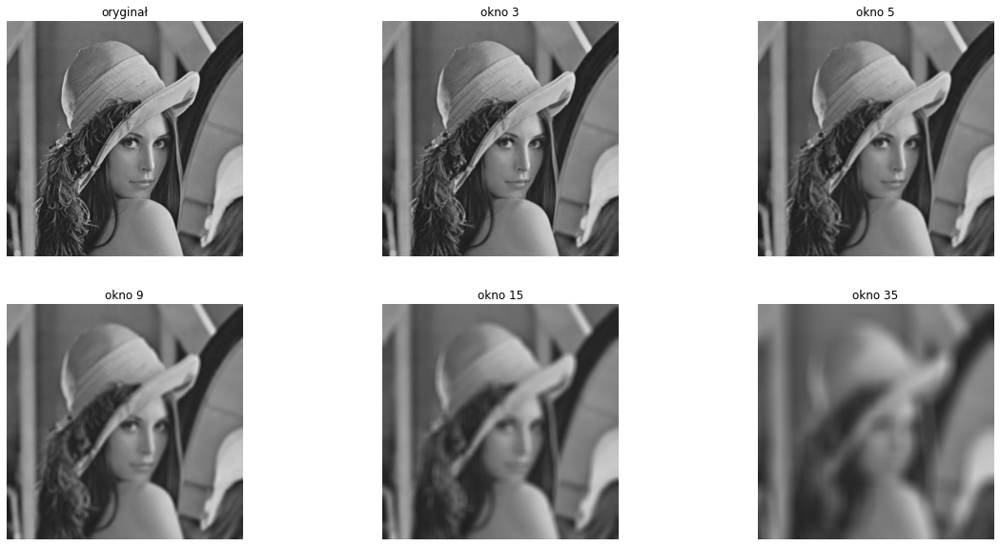

In [4]:
I1 = cv2.imread('lena.png')
I1 = cv2.cvtColor(I1, cv2.COLOR_BGR2GRAY)

fig, axs = plt.subplots(2, 3)
fig.set_size_inches(20, 10)

axs[0, 0].imshow(I1, 'gray', vmin=0, vmax=256)
axs[0, 0].axis('off')
axs[0, 0].set_title("oryginał")
axs[0, 1].imshow(cv2.filter2D(I1, -1, np.ones((3,3))/9), 'gray', vmin=0, vmax=256)
axs[0, 1].axis('off')
axs[0, 1].set_title("okno 3")
axs[0, 2].imshow(cv2.filter2D(I1, -1, np.ones((5,5))/25), 'gray', vmin=0, vmax=256)
axs[0, 2].axis('off')
axs[0, 2].set_title("okno 5")
axs[1, 0].imshow(cv2.filter2D(I1, -1, np.ones((9,9))/81), 'gray', vmin=0, vmax=256)
axs[1, 0].axis('off')
axs[1, 0].set_title("okno 9")
axs[1, 1].imshow(cv2.filter2D(I1, -1, np.ones((15,15))/(15*15)), 'gray', vmin=0, vmax=256)
axs[1, 1].axis('off')
axs[1, 1].set_title("okno 15")
axs[1, 2].imshow(cv2.filter2D(I1, -1, np.ones((35,35))/(35*35)), 'gray', vmin=0, vmax=256)
axs[1, 2].axis('off')
axs[1, 2].set_title("okno 35")

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

(-0.5, 511.5, 511.5, -0.5)

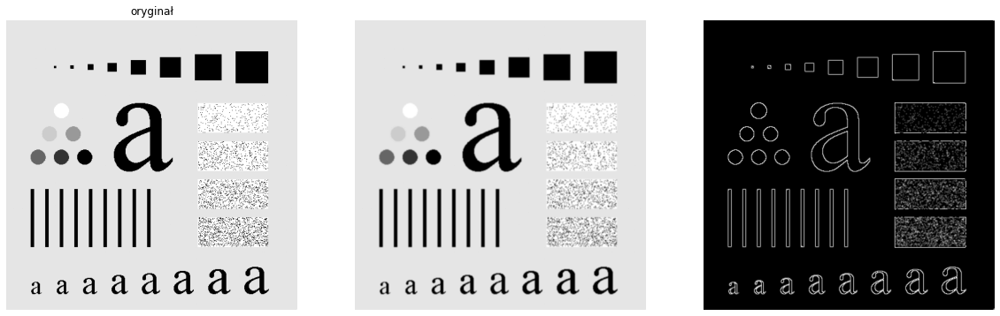

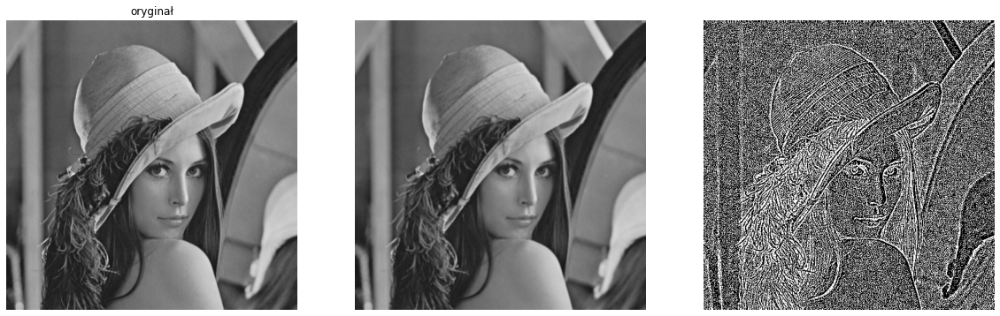

In [5]:
M = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])
M = M / np.sum(M)

res = cv2.filter2D(I, -1, M)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(I-res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

res = cv2.filter2D(I1, -1, M)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I1, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(I1-res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


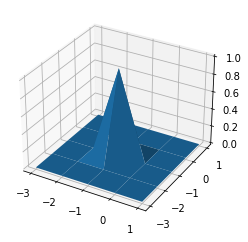

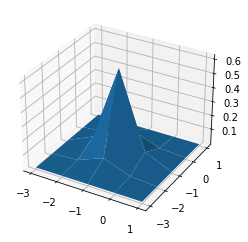

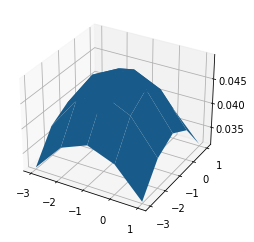

In [6]:
def fgaussian(size, sigma):
     m = n = size
     h, k = m//2, n//2
     x, y = np.mgrid[-h:h+1, -k:k+1]
     g = np.exp(-(x**2 + y**2)/(2*sigma**2))
     return g /g.sum() 
    
    
def mesh(fun, size):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    

    X = np.arange(-size//2, size//2, 1)
    Y = np.arange(-size//2, size//2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    
    ax.plot_surface(X, Y, Z)
    
    plt.show()
    
mask1 = fgaussian(5, 0.1)
mesh(mask1, 5)
    
mask2 = fgaussian(5, 0.5)
mesh(mask2, 5)

mask3 = fgaussian(5, 3)
mesh(mask3, 5)
    



Text(0.5, 1.0, 'GaussianBlur 2')

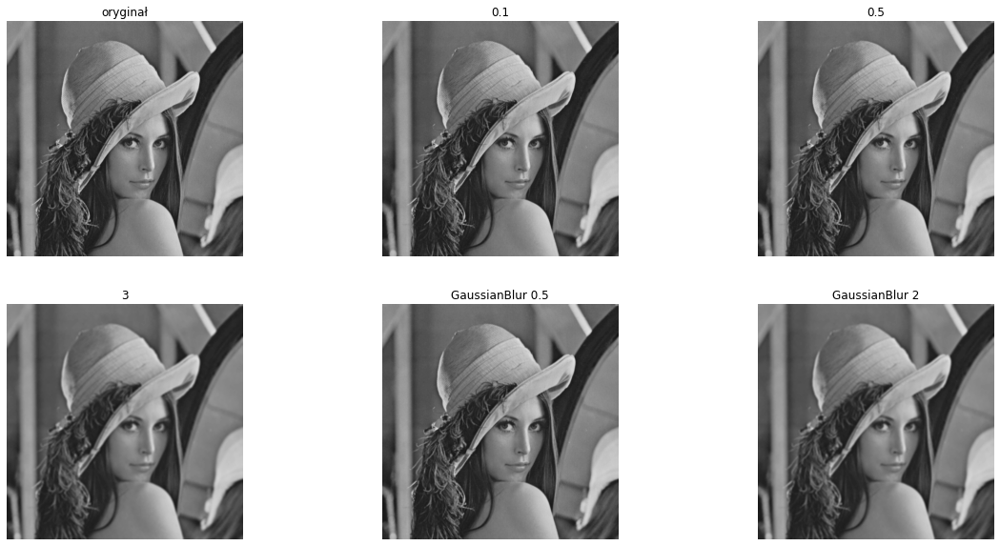

In [7]:
fig, axs = plt.subplots(2, 3)
fig.set_size_inches(20, 10)

axs[0, 0].imshow(I1, 'gray', vmin=0, vmax=256)
axs[0, 0].axis('off')
axs[0, 0].set_title("oryginał")
axs[0, 1].imshow(cv2.filter2D(I1, -1, mask1), 'gray', vmin=0, vmax=256)
axs[0, 1].axis('off')
axs[0, 1].set_title("0.1")
axs[0, 2].imshow(cv2.filter2D(I1, -1, mask2), 'gray', vmin=0, vmax=256)
axs[0, 2].axis('off')
axs[0, 2].set_title("0.5")
axs[1, 0].imshow(cv2.filter2D(I1, -1, mask3), 'gray', vmin=0, vmax=256)
axs[1, 0].axis('off')
axs[1, 0].set_title("3")
axs[1, 1].imshow(cv2.GaussianBlur(I1, ksize=[5, 5], sigmaX=0.5), 'gray', vmin=0, vmax=256)
axs[1, 1].axis('off')
axs[1, 1].set_title("GaussianBlur 0.5")
axs[1, 2].imshow(cv2.GaussianBlur(I1, ksize=[5, 5], sigmaX=2), 'gray', vmin=0, vmax=256)
axs[1, 2].axis('off')
axs[1, 2].set_title("GaussianBlur 2")

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


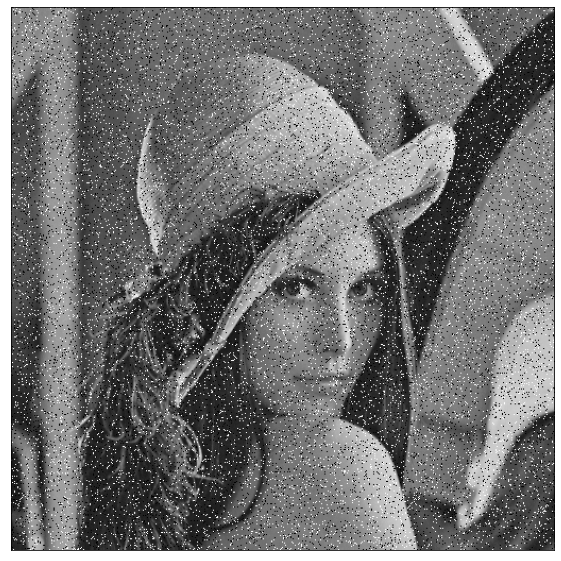

(-0.5, 511.5, 511.5, -0.5)

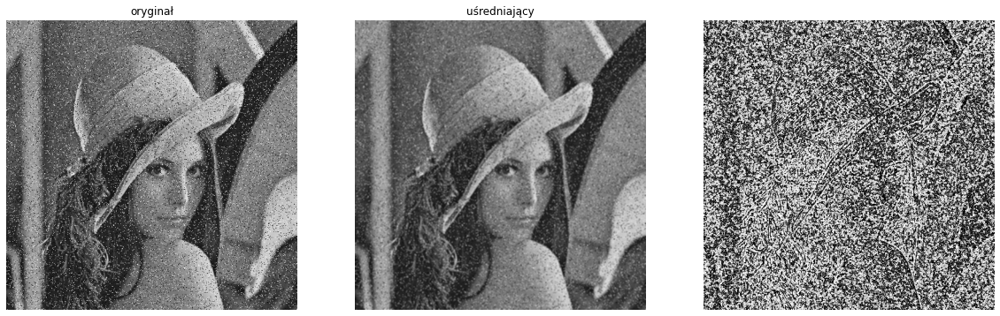

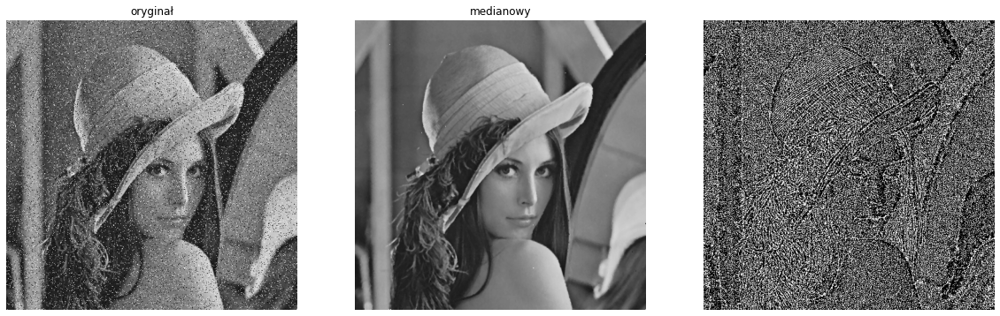

In [8]:
I3 = cv2.imread('lenaSzum.png') 
I3 = cv2.cvtColor(I3, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(10,10))
plt.imshow(I3, cmap ="gray")
plt.xticks([]), plt.yticks([])  # Hides the graph ticks and x / y axis
plt.show()

res = cv2.filter2D(I3, -1, np.ones((3,3))/9)


fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I3, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[1].set_title("uśredniający")
axs[2].imshow(np.abs(I3-res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


res = cv2.medianBlur(I3, 3)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I3, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[1].set_title("medianowy")
axs[2].imshow(np.abs(I3-res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')




2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

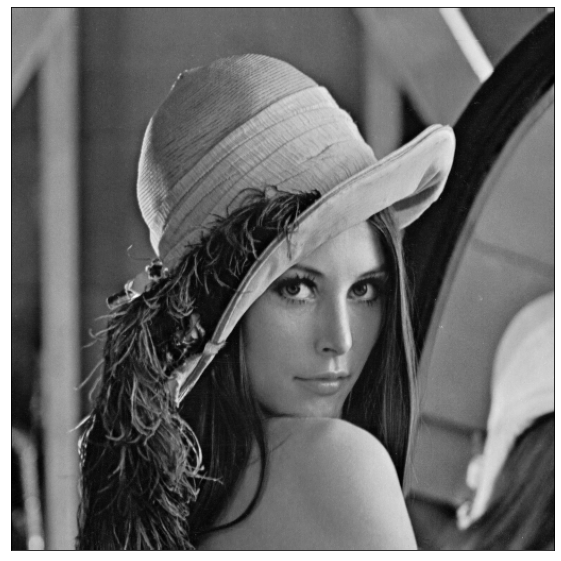

(-0.5, 511.5, 511.5, -0.5)

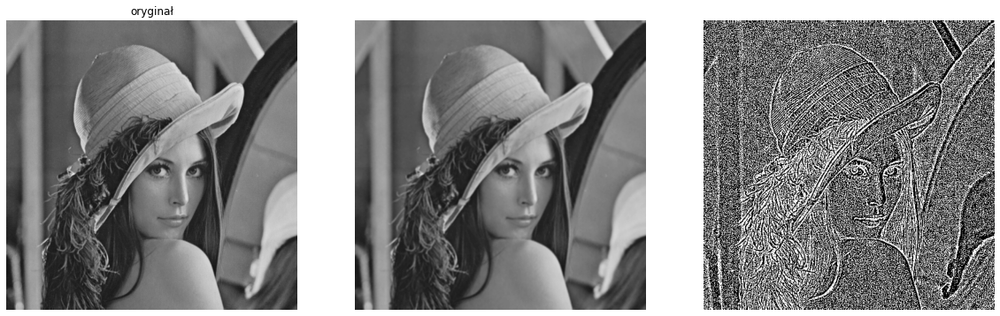

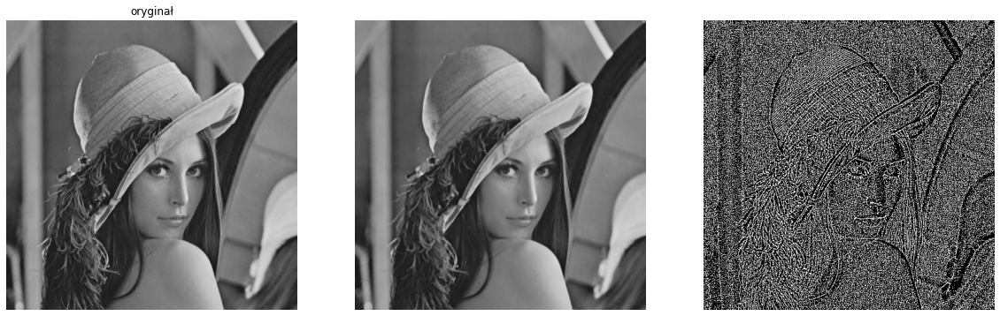

In [9]:
plt.figure(figsize=(10,10))
plt.imshow(I1, cmap ="gray")
plt.xticks([]), plt.yticks([])  # Hides the graph ticks and x / y axis
plt.show()

res = cv2.filter2D(I1, -1, np.ones((3,3))/9)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I1, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(I1-res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

res = cv2.medianBlur(I1, 3)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I1, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(I1-res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')




3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

(-0.5, 511.5, 511.5, -0.5)

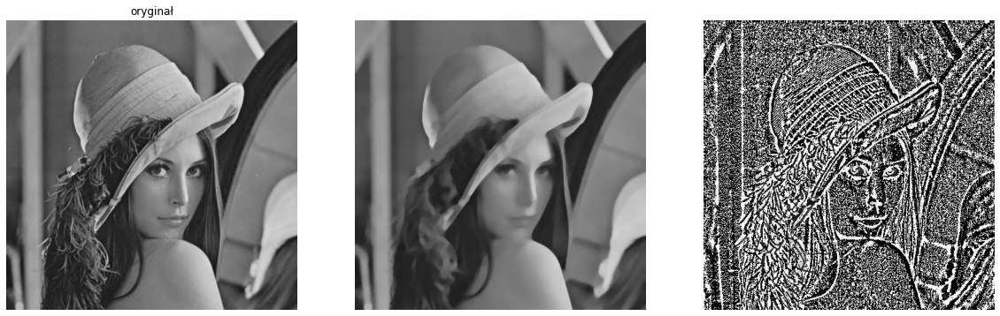

In [10]:
res = I1
for _ in range (10):
    res = cv2.medianBlur(res, 5)
    
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I1, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(I1-res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach. 

(-0.5, 465.5, 539.5, -0.5)

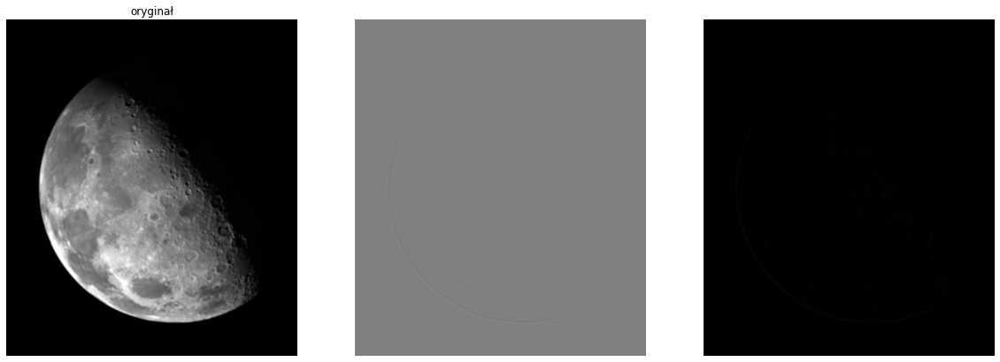

In [11]:
I4 = cv2.imread('moon.png') 
I4 = cv2.cvtColor(I4, cv2.COLOR_BGR2GRAY)

M = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
M = M / 9

I4=I4.astype('int16')


res = cv2.filter2D(I4, -1, M)


fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I4, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



(-0.5, 465.5, 539.5, -0.5)

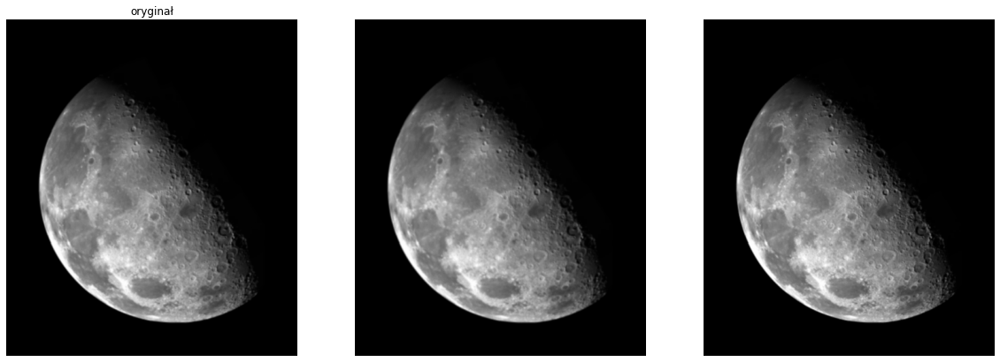

In [12]:
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I4, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I4.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I4.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

(-0.5, 255.5, 255.5, -0.5)

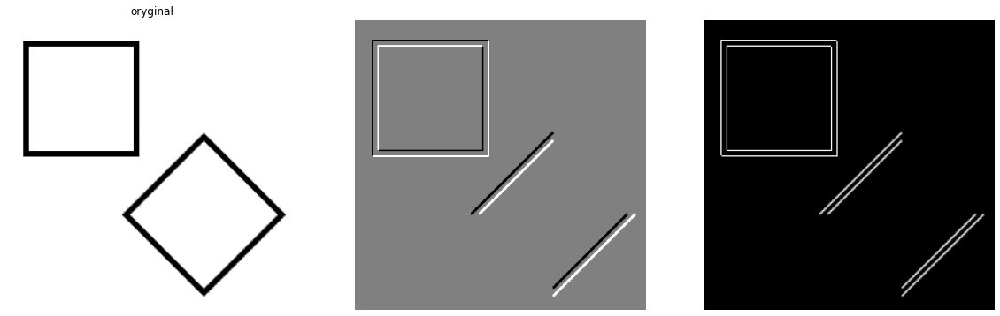

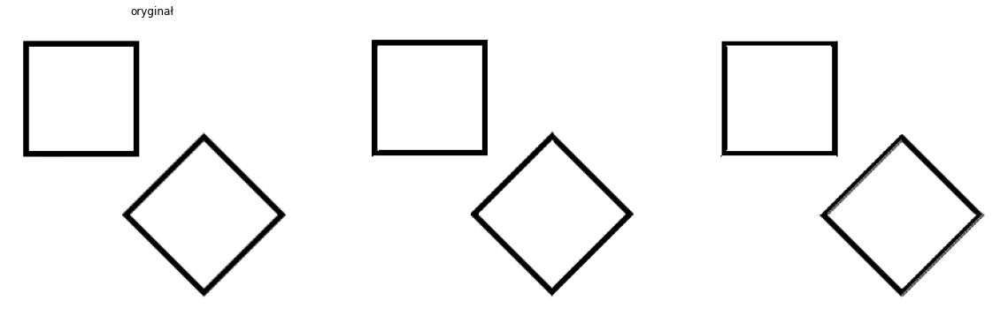

In [13]:
I5 = cv2.imread('kw.png')
I5 = cv2.cvtColor(I5, cv2.COLOR_BGR2GRAY)
I5=I5.astype('int16')


R1 = np.array([[0, 0, 0], [-1, 0, 0], [0, 1, 0]])

R2 = np.array([[0, 0, 0], [0, 0, -1], [0, 1, 0]])

res = cv2.filter2D(I5, -1, R1)


fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I5.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I5.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


(-0.5, 255.5, 255.5, -0.5)

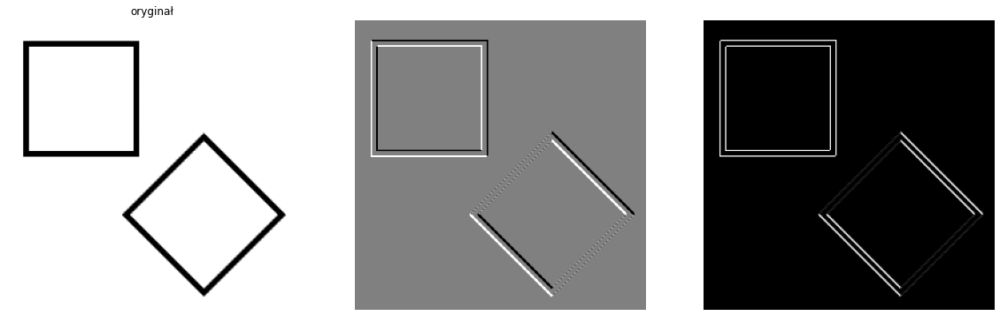

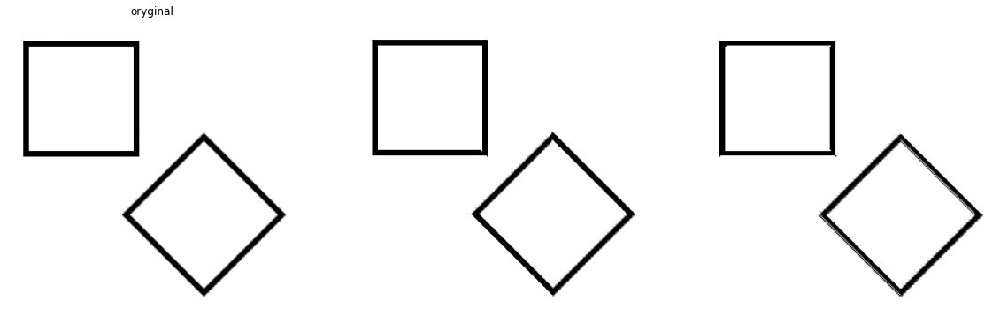

In [14]:
res = cv2.filter2D(I5, -1, R2)


fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I5.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I5.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


(-0.5, 255.5, 255.5, -0.5)

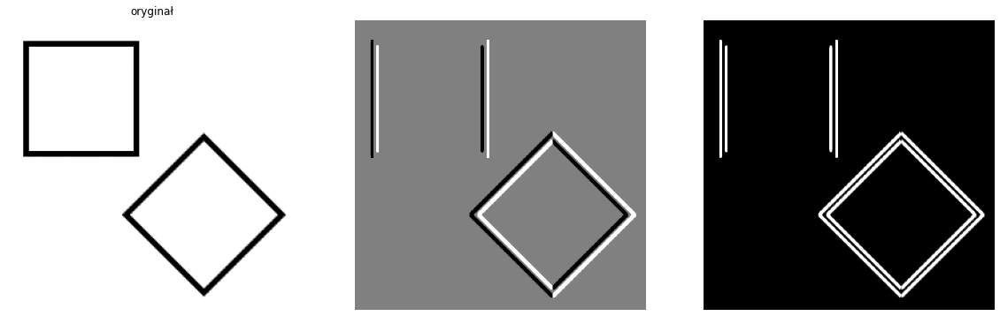

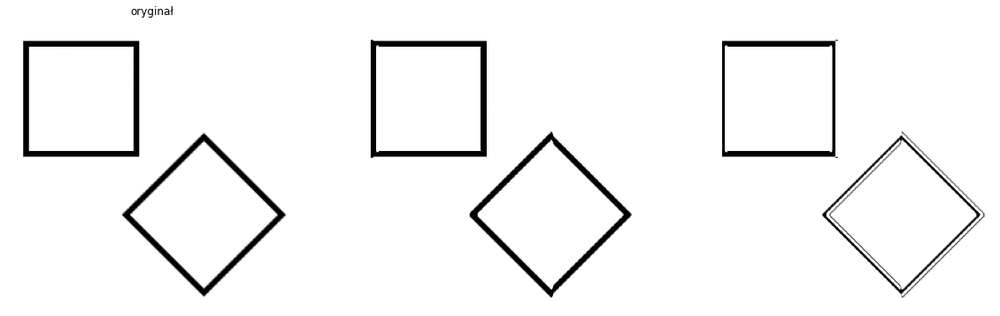

In [15]:
P1 = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])

P2 = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

res = cv2.filter2D(I5, -1, P1)


fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I5.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I5.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


(-0.5, 255.5, 255.5, -0.5)

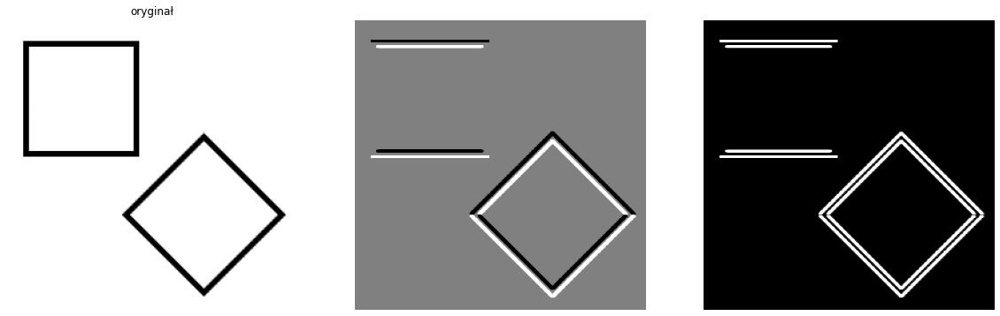

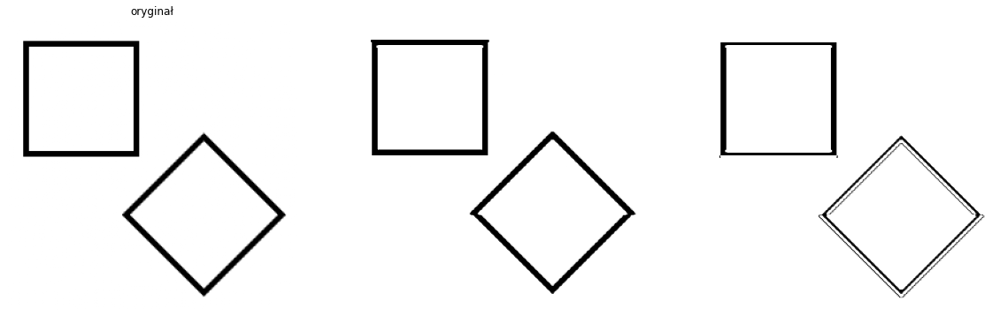

In [16]:
res = cv2.filter2D(I5, -1, P2)


fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I5.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I5.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


(-0.5, 255.5, 255.5, -0.5)

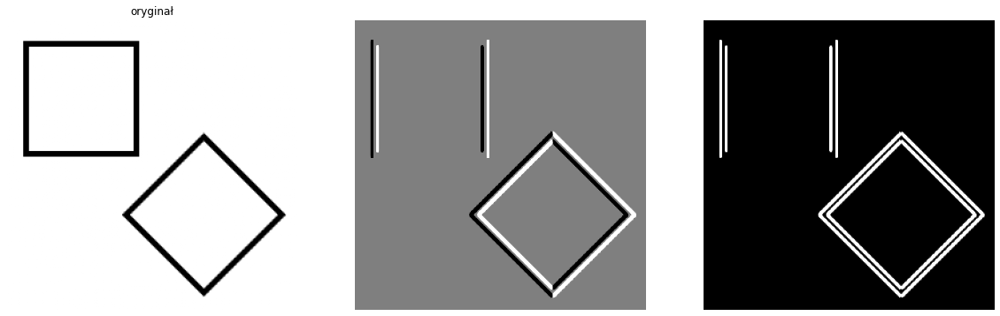

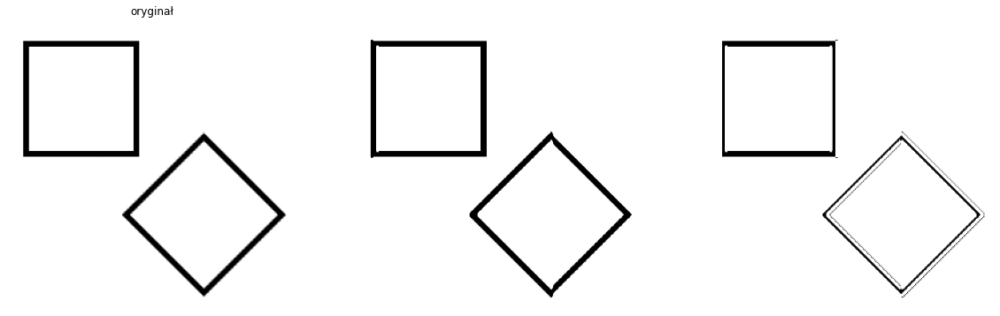

In [17]:
S1 = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

S2 = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

res = cv2.filter2D(I5, -1, S1)


fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I5.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I5.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


(-0.5, 255.5, 255.5, -0.5)

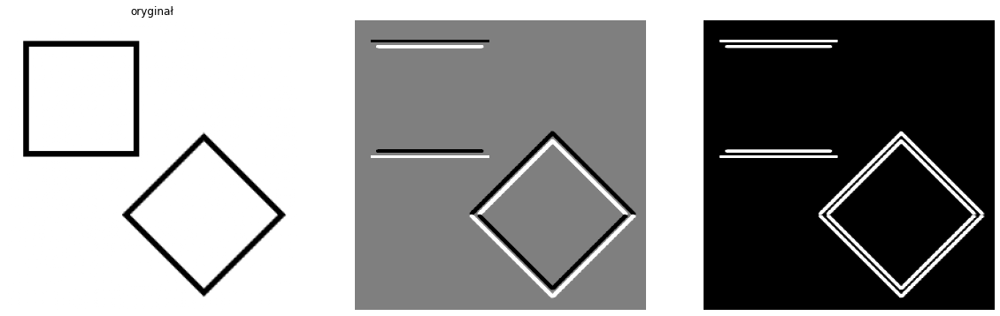

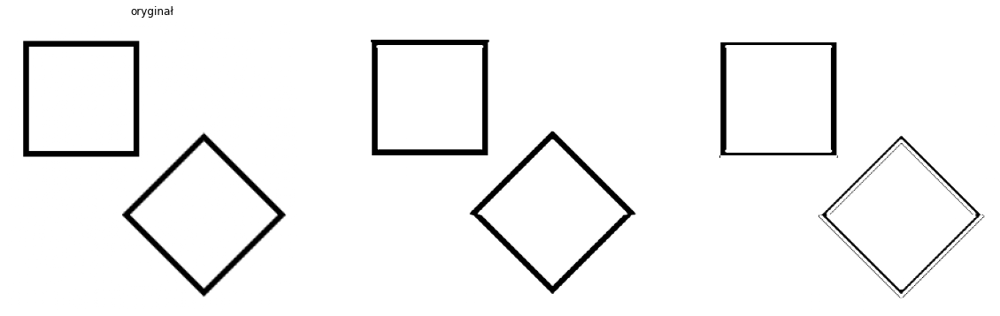

In [18]:
res = cv2.filter2D(I5, -1, S2)


fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I5.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I5.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



<ipython-input-19-f56342c2396d>:1: RuntimeWarning: invalid value encountered in sqrt
  res = np.sqrt((cv2.filter2D(I5, -1, S1))**2 + (cv2.filter2D(I5, -1, S2))**2).astype(int)


(-0.5, 255.5, 255.5, -0.5)

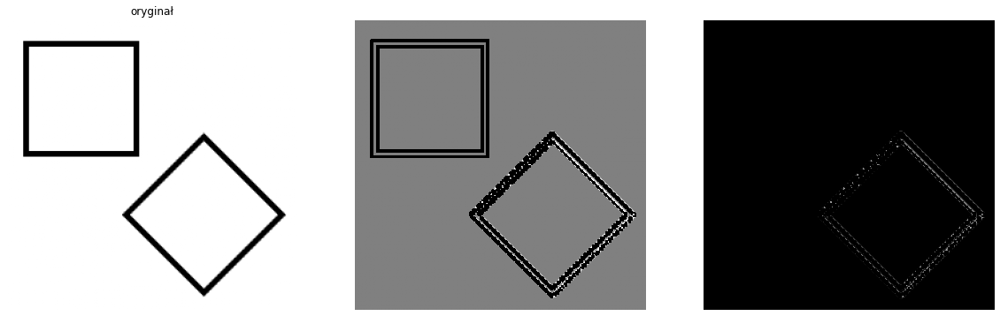

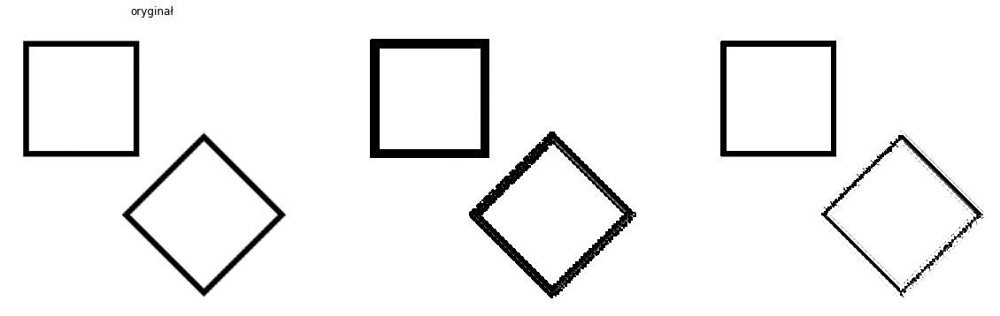

In [19]:
res = np.sqrt((cv2.filter2D(I5, -1, S1))**2 + (cv2.filter2D(I5, -1, S2))**2).astype(int)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I5.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I5.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

(-0.5, 255.5, 255.5, -0.5)

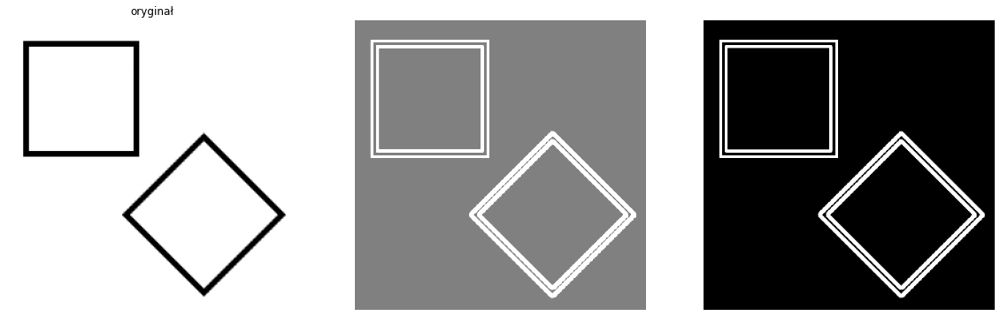

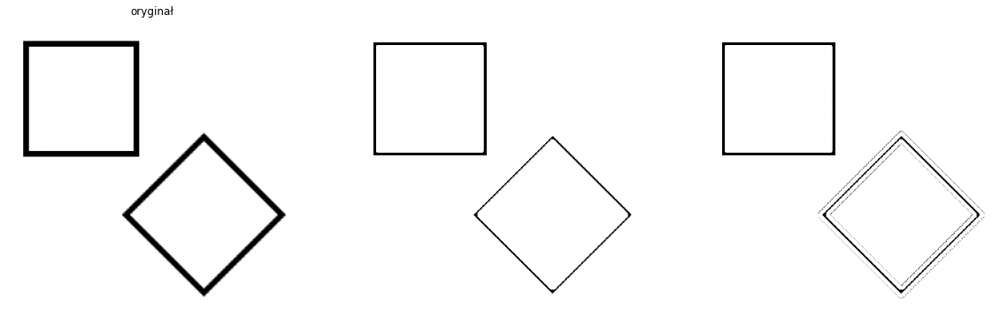

In [20]:
res = np.abs(cv2.filter2D(I5, -1, S1)) + np.abs(cv2.filter2D(I5, -1, S2))

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I5, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I5.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I5.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

<ipython-input-21-60a2f44d4c2c>:4: RuntimeWarning: invalid value encountered in sqrt
  res = np.sqrt((cv2.filter2D(I6, -1, S1))**2 + (cv2.filter2D(I6, -1, S2))**2).astype(int)


(-0.5, 511.5, 511.5, -0.5)

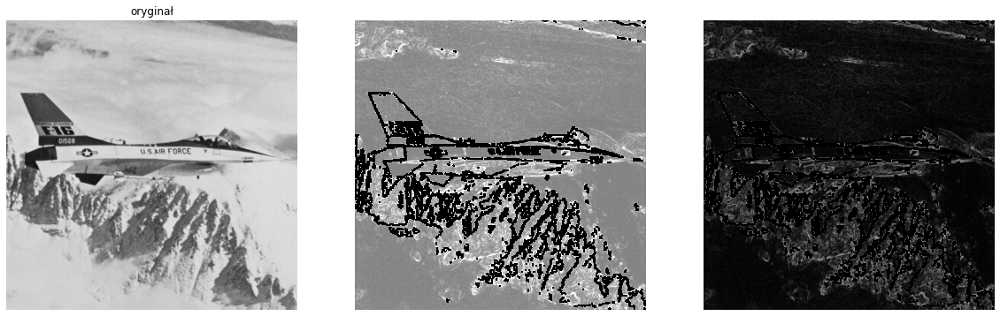

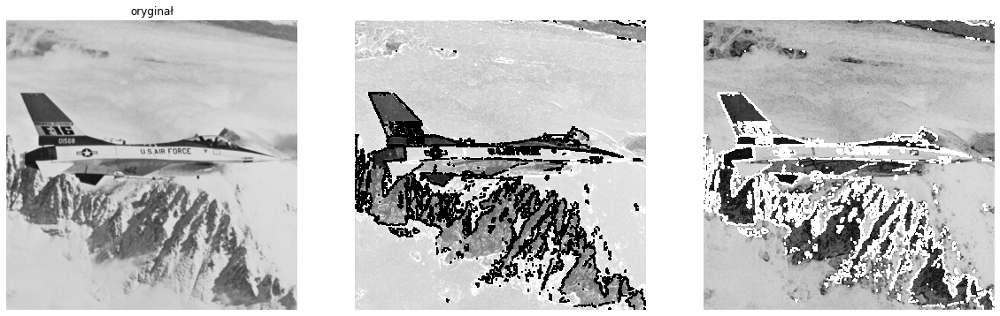

In [21]:
I6 = cv2.imread('jet.png')
I6 = cv2.cvtColor(I6, cv2.COLOR_BGR2GRAY)
I6=I6.astype('int16')
res = np.sqrt((cv2.filter2D(I6, -1, S1))**2 + (cv2.filter2D(I6, -1, S2))**2).astype(int)

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I6, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I6, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I6.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I6.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')


(-0.5, 511.5, 511.5, -0.5)

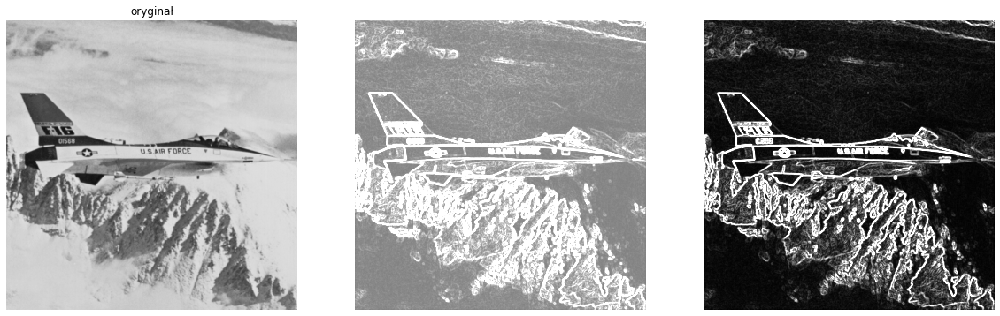

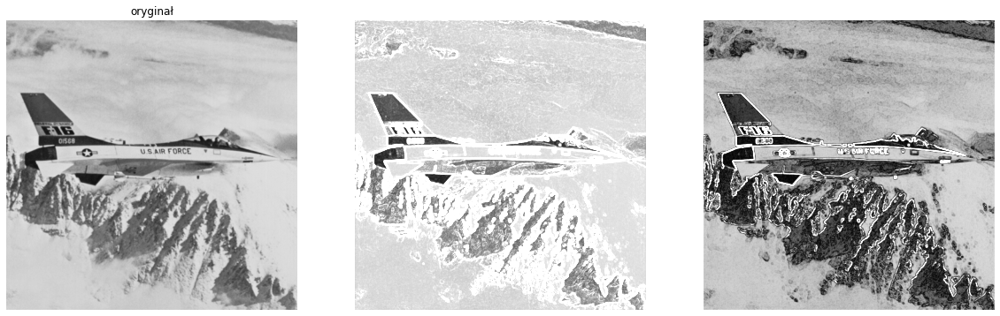

In [22]:
res = np.abs(cv2.filter2D(I6, -1, S1)) + np.abs(cv2.filter2D(I6, -1, S2))

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I6, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+128, 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res), 'gray', vmin=0, vmax=256)
axs[2].axis('off')

fig, axs = plt.subplots(1, 3)
fig.set_size_inches(20, 10)

axs[0].imshow(I6, 'gray', vmin=0, vmax=256)
axs[0].axis('off')
axs[0].set_title("oryginał")
axs[1].imshow(res+I6.astype(int), 'gray', vmin=0, vmax=256)
axs[1].axis('off')
axs[2].imshow(np.abs(res-I6.astype(int)), 'gray', vmin=0, vmax=256)
axs[2].axis('off')
